# Reverse Correlation Annotation Analysis

## Setup

In [2]:
import os
import glob
import pandas as pd
import numpy as np

from scipy import stats

from matplotlib.colors import to_hex
import matplotlib.pyplot as plt
import seaborn as sns
from nilearn.plotting import plot_roi
#import SUITPy.flatmap as flatmap

### Set directories

In [4]:
#proj_dir = '/Users/hpopal/Google Drive/My Drive/dscn_lab/projects/net/'
proj_dir = '/Users/haroonpopal/hpopal@umd.edu - Google Drive/My Drive/dscn_lab/projects/net/'
data_dir = proj_dir+'derivatives/reverse_correlation/subject_data/'
outp_dir = proj_dir+'derivatives/reverse_correlation/group_results/'

os.chdir(proj_dir)

### Load participant information

In [3]:
mri_qc_data = pd.read_csv(proj_dir+'derivatives/participants-qc.csv')

# Remove T1 info
mri_qc_data = mri_qc_data[mri_qc_data['Run'] != 'T1']

# Createa a participants list
subjs_list = mri_qc_data['participant_id'].unique()

### Import cerebellum parcellation

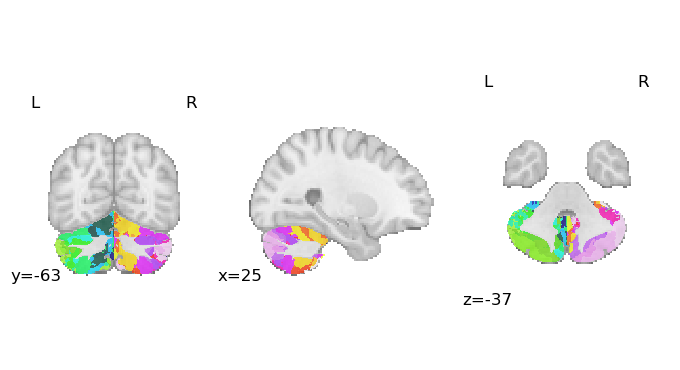

In [5]:
# cerebellum parcellation
cb_atlas = proj_dir + 'derivatives/rois/Nettekoven_2023/atl-NettekovenAsym32_space-MNI152NLin2009cSymC_dseg.nii'

plot_roi(cb_atlas, draw_cross=False)

In [6]:
cb_atlas_labels = pd.read_csv(proj_dir+'derivatives/rois/Nettekoven_2023/atl-NettekovenAsym32.lut', sep=' ',
                             names=['Value', 'R', 'G', 'B', 'Label'])

cb_roi_names = cb_atlas_labels['Label'][1:]

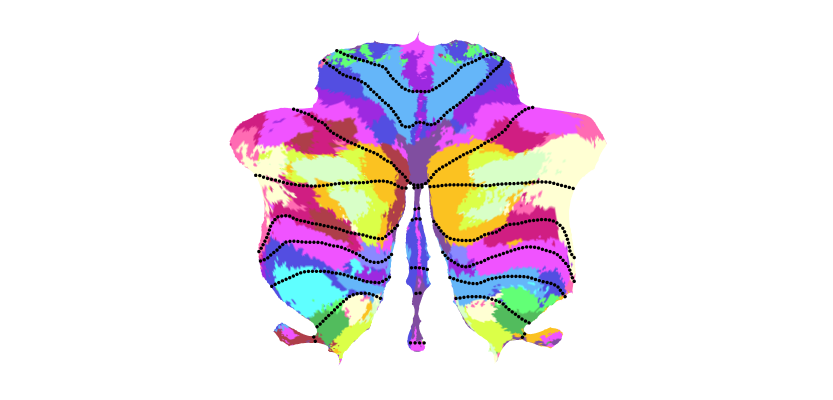

In [6]:
# Import as a flatmap
cb_atlas_flat = flatmap.plot(proj_dir+'derivatives/rois/Nettekoven_2023/atl-NettekovenAsym32_dseg.label.gii',
                             overlay_type='label',
                             new_figure=True, 
                             colorbar=True,
                             render='plotly')
cb_atlas_flat.show()

## Second-Level (Group) Analysis

### Load first-level data

In [7]:
subj_ts_files = glob.glob(data_dir+'*_cb_atlas_ts.csv')
len(subj_ts_files)

380

In [8]:
run_trs = {'1':476, '2':480, '3':476, '4':472, '5':268, '6':191, '7':505}


cb_subj_data_ts = dict()

for temp_label in cb_atlas_labels['Label'][1:]:
    cb_subj_data_ts[temp_label] = pd.DataFrame(columns=['Participant_ID','Run', 'n_tr'])

i_row = 0

for subj in subjs_list:
    # Find run numbers for subject
    subj_ts_files = glob.glob(data_dir+subj+'*_cb_atlas_ts.csv')
    subj_ts_files.sort()
    subj_run_nums = [x.split('run-')[-1][0] for x in subj_ts_files]
    
    for run_idx in range(len(subj_run_nums)):
        temp_file_path = subj_ts_files[run_idx]
        cb_data_ts_df = pd.read_csv(temp_file_path)
        n_tr = len(cb_data_ts_df)

        if n_tr != run_trs[subj_run_nums[run_idx]]:
            continue
    
        for temp_label in cb_roi_names:
            cb_subj_data_ts[temp_label].loc[i_row, 'Participant_ID'] = subj
            cb_subj_data_ts[temp_label].loc[i_row, 'Run'] = subj_run_nums[run_idx]
            cb_subj_data_ts[temp_label].loc[i_row, 'n_tr'] = n_tr
            cb_subj_data_ts[temp_label].loc[i_row, range(n_tr)] = cb_data_ts_df[temp_label].to_list()

        i_row += 1

### Calculate one-sample t-tests for each TR

In [9]:
# Conduct one-sample t-tests at each time point for each ROI

# Create dictionary for t and p values
cb_subj_data_ts_t = dict()
#cb_subj_data_ts_p = dict()

for temp_label in cb_roi_names:
    cb_subj_data_ts_t[temp_label] = dict()

    for run_num in cb_subj_data_ts[temp_label]['Run'].unique():
        
        temp_run_data = cb_subj_data_ts[temp_label][cb_subj_data_ts[temp_label]['Run'] == run_num]
        temp_run_data = temp_run_data.dropna(axis=1)

        n_tr = temp_run_data.iloc[0]['n_tr']
        cb_subj_data_ts_t[temp_label][run_num] = pd.DataFrame(columns=list(range(n_tr-1)),
                                               index=['mean', 't', 'p'])
        
        for i_col in temp_run_data.columns[3:]:
            temp_stats = stats.ttest_1samp(temp_run_data.loc[:,i_col].to_list(), 
                                           popmean=0)
            temp_mean = np.mean(temp_run_data.loc[:, i_col])
            
            cb_subj_data_ts_t[temp_label][run_num].loc['mean',i_col] = temp_mean
            cb_subj_data_ts_t[temp_label][run_num].loc['t',i_col] = temp_stats.statistic
            cb_subj_data_ts_t[temp_label][run_num].loc['p',i_col] = temp_stats.pvalue
            
        
        # FDR correction
        temp_p_adj = stats.false_discovery_control(cb_subj_data_ts_t[temp_label][run_num].loc['p'].to_list())
        cb_subj_data_ts_t[temp_label][run_num].loc['p_fdr'] = temp_p_adj
        
        # Export
        cb_subj_data_ts_t[temp_label][run_num].to_csv(outp_dir+temp_label+'_run-'+run_num+'_ts_stats.csv')


### Calculate significant TR windows
After multiple comparisons correction, mark windows of TRs (at least three consecutive) that were significantly activated.

In [10]:
for temp_label in cb_roi_names:
    for run_num in cb_subj_data_ts[temp_label]['Run'].unique():
        cb_subj_data_ts_t[temp_label][run_num].loc['sig_tw'] = 0
        
        for i_col in range(len(cb_subj_data_ts_t[temp_label][run_num].columns)-2):
            count_sig = (cb_subj_data_ts_t[temp_label][run_num].loc['p_fdr',i_col:i_col+2] < .05).sum()
            if count_sig == 3:
                cb_subj_data_ts_t[temp_label][run_num].loc['sig_tw',i_col:i_col+2] = 1
        
        cb_subj_data_ts_t[temp_label][run_num].to_csv(outp_dir+temp_label+'_run-'+run_num+'_ts_stats.csv', index=False)

cb_subj_data_ts_t[temp_label][run_num].head()

,0,1,2,3,4,5,6,7,8,9,...,495,496,497,498,499,500,501,502,503,504
mean,0.015431,-0.022625,0.045655,0.150466,0.062184,0.184379,-0.007663,-0.194081,0.158207,0.185191,...,-0.26863,-0.155547,-0.338253,-0.137153,-0.387398,-0.363765,-0.361422,-0.296421,-0.430294,-0.174376
t,0.286766,-0.120778,0.247969,0.741185,0.33513,0.914676,-0.041714,-1.086375,0.809498,1.029,...,-1.396928,-0.670309,-1.823186,-0.586533,-2.146097,-1.813772,-1.656574,-1.590002,-1.71404,-1.428157
p,0.775849,0.904503,0.805493,0.463137,0.73937,0.36613,0.966945,0.284157,0.423269,0.309985,...,0.17054,0.506714,0.076149,0.560986,0.038314,0.077616,0.105841,0.120121,0.094669,0.161414
p_fdr,0.872614,0.945702,0.894009,0.6518,0.850528,0.554256,0.980537,0.47993,0.612467,0.501739,...,0.337736,0.689732,0.213641,0.732036,0.129892,0.216552,0.253593,0.272022,0.245168,0.329048
sig_tw,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000


#### Load group ROI level data

In [8]:
load_data = True

# Combine runs to be one time series

group_roi_ts_stats = dict()

for temp_label in cb_roi_names:
    if load_data:
        group_roi_ts_stats[temp_label] = pd.read_csv(outp_dir+temp_label+'_ts_stats.csv')

    else:
        group_roi_ts_stats[temp_label] = pd.DataFrame()
        
        for run_num in cb_subj_data_ts_t[temp_label].keys():
            run_df = cb_subj_data_ts_t[temp_label][run_num].T
            run_df['Run'] = run_num
    
            group_roi_ts_stats[temp_label] = pd.concat([group_roi_ts_stats[temp_label], run_df])
            group_roi_ts_stats[temp_label] = group_roi_ts_stats[temp_label].reset_index(drop=True)
    
        # Export
        group_roi_ts_stats[temp_label].to_csv(outp_dir+temp_label+'_ts_stats.csv')

#### Plot signficant TR windows

In [9]:
group_roi_ts_stats['A1L'].head()

,Unnamed: 0,mean,t,p,p_fdr,sig_tw,Run
0,0,0.055959,0.532903,0.596137,0.754684,0.0,1
1,1,-0.414991,-2.732956,0.008307,0.065990,0.0,1
2,2,-0.262972,-1.428261,0.158580,0.393145,0.0,1
3,3,-0.020336,-0.116213,0.907885,0.949963,0.0,1
4,4,0.290447,1.771013,0.081813,0.253291,0.0,1


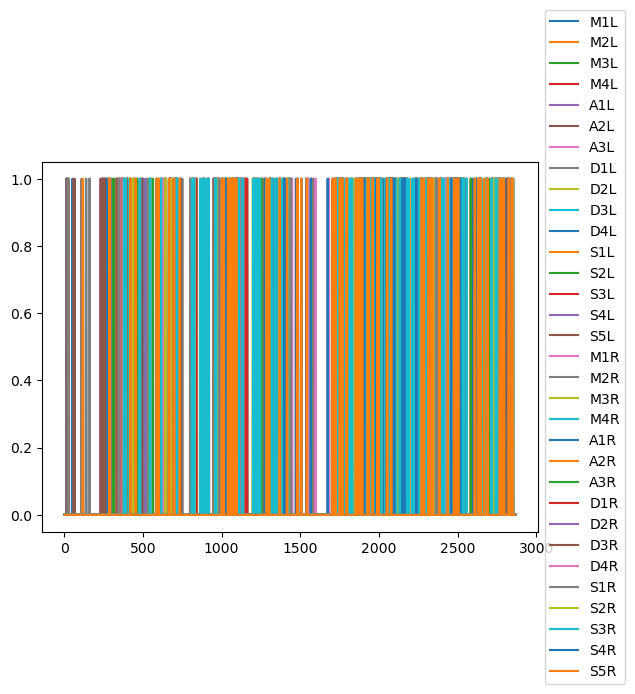

In [10]:
plt.figure()

for temp_label in cb_roi_names:
    group_roi_ts_stats[temp_label]['sig_tw'].plot(label=temp_label)
    
plt.legend(loc='center left', bbox_to_anchor=(1,0.5))

### Activation window similarity

In [11]:
# Calculate mutual agreement between each cerebellum ROI
from sklearn.metrics import mutual_info_score

# Create empty dataframe to serve as matrix
sig_roi_mtx = pd.DataFrame(columns=cb_roi_names, 
                           index=cb_roi_names)

for temp_roi_a in cb_roi_names:
    temp_data_a = group_roi_ts_stats[temp_roi_a]['sig_tw']
    
    for temp_roi_b in cb_roi_names:
        temp_data_b = group_roi_ts_stats[temp_roi_b]['sig_tw']
        
        temp_score = sum(temp_data_a == temp_data_b) / len(temp_data_a)
        
        sig_roi_mtx.loc[temp_roi_a, temp_roi_b] =  temp_score

Text(0, 0.5, 'Z-Scored Mean Signal')

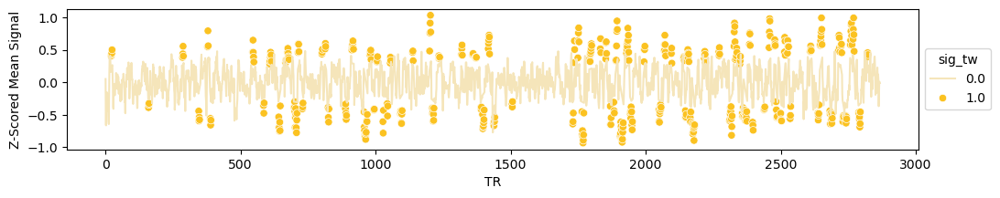

In [12]:
temp_roi = 'S1R'

roi_hex = to_hex(list(cb_atlas_labels.loc[cb_atlas_labels['Label'] == temp_roi, ['R','G','B']].iloc[0]))
roi_palette = sns.color_palette('light:'+roi_hex, 5)

fig = plt.figure(figsize=(12, 2))

roi_unc_data = group_roi_ts_stats[temp_roi][group_roi_ts_stats[temp_roi]['sig_tw'] == 0]
roi_sig_data = group_roi_ts_stats[temp_roi][group_roi_ts_stats[temp_roi]['sig_tw'] == 1]

ax = sns.lineplot(data=roi_unc_data, x=roi_unc_data.index, y='mean', 
                  hue='sig_tw', palette=(roi_palette[1], roi_palette[1]))
ax2 = sns.scatterplot(data=roi_sig_data, x=roi_sig_data.index, y='mean', 
             hue='sig_tw', palette=(roi_palette[4], roi_palette[4]))
sns.move_legend(ax, 'center left', bbox_to_anchor=(1,0.5))
plt.xlabel('TR') 
plt.ylabel('Z-Scored Mean Signal')

Text(0, 0.5, 'Z-Scored Mean Signal')

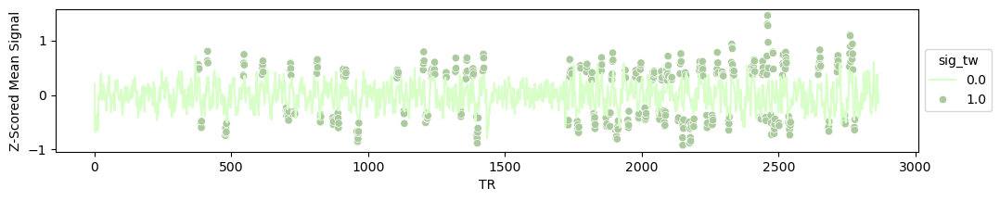

In [14]:
temp_roi = 'S3R'

roi_hex = to_hex(list(cb_atlas_labels.loc[cb_atlas_labels['Label'] == temp_roi, ['R','G','B']].iloc[0]))
roi_palette = sns.color_palette('dark:'+roi_hex, 5)

fig = plt.figure(figsize=(12, 2))

roi_unc_data = group_roi_ts_stats[temp_roi][group_roi_ts_stats[temp_roi]['sig_tw'] == 0]
roi_sig_data = group_roi_ts_stats[temp_roi][group_roi_ts_stats[temp_roi]['sig_tw'] == 1]

ax = sns.lineplot(data=roi_unc_data, x=roi_unc_data.index, y='mean', 
                  hue='sig_tw', palette=(roi_palette[4], roi_palette[4]))
ax2 = sns.scatterplot(data=roi_sig_data, x=roi_sig_data.index, y='mean', 
             hue='sig_tw', palette=(roi_palette[3], roi_palette[3]))
sns.move_legend(ax, 'center left', bbox_to_anchor=(1,0.5))
plt.xlabel('TR') 
plt.ylabel('Z-Scored Mean Signal')

In [59]:
sig_roi_mtx = sig_roi_mtx.reindex(sorted(sig_roi_mtx.columns), axis=1)
sig_roi_mtx = sig_roi_mtx.reindex(sorted(sig_roi_mtx.index), axis=0)


Label,A1L,A1R,A2L,A2R,A3L,A3R,D1L,D1R,D2L,D2R,...,S1L,S1R,S2L,S2R,S3L,S3R,S4L,S4R,S5L,S5R
Label,,,,,,,,,,,,,,,,,,,,,
A1L,1.0,0.872385,0.831241,0.845188,0.845188,0.831241,0.775105,0.831939,0.817643,0.829498,...,0.770921,0.789749,0.750349,0.776151,0.781032,0.756276,0.825662,0.831241,0.829149,0.825314
A1R,0.872385,1.0,0.851464,0.856346,0.851464,0.828452,0.767434,0.850767,0.811367,0.838563,...,0.761158,0.817643,0.746165,0.79219,0.779637,0.763947,0.825662,0.829847,0.830544,0.827406
A2L,0.831241,0.851464,1.0,0.912134,0.867503,0.829149,0.814854,0.866109,0.832287,0.847629,...,0.798117,0.82113,0.770572,0.790098,0.785216,0.763947,0.829847,0.833333,0.831939,0.837169
A2R,0.845188,0.856346,0.912134,1.0,0.906555,0.886332,0.811367,0.898187,0.881102,0.903417,...,0.809972,0.854603,0.787308,0.829149,0.824268,0.800907,0.888424,0.894003,0.886332,0.887378
A3L,0.845188,0.851464,0.867503,0.906555,1.0,0.956764,0.779986,0.900279,0.924338,0.944561,...,0.79742,0.838563,0.776848,0.843794,0.855649,0.83159,0.945607,0.945607,0.937936,0.898536
A3R,0.831241,0.828452,0.829149,0.886332,0.956764,1.0,0.770223,0.898884,0.938285,0.957113,...,0.791144,0.835774,0.771967,0.856346,0.857741,0.846234,0.972106,0.967922,0.960251,0.906206
D1L,0.775105,0.767434,0.814854,0.811367,0.779986,0.770223,1.0,0.832287,0.792887,0.788006,...,0.880056,0.827057,0.815551,0.77371,0.776499,0.733612,0.775802,0.781381,0.777894,0.787308
D1R,0.831939,0.850767,0.866109,0.898187,0.900279,0.898884,0.832287,1.0,0.881102,0.908298,...,0.835774,0.91318,0.797768,0.879358,0.838215,0.847629,0.8947,0.909344,0.891911,0.867155
D2L,0.817643,0.811367,0.832287,0.881102,0.924338,0.938285,0.792887,0.881102,1.0,0.949093,...,0.809623,0.817294,0.795328,0.833682,0.871339,0.827057,0.95781,0.940377,0.92364,0.889121


<Axes: xlabel='Label', ylabel='Label'>

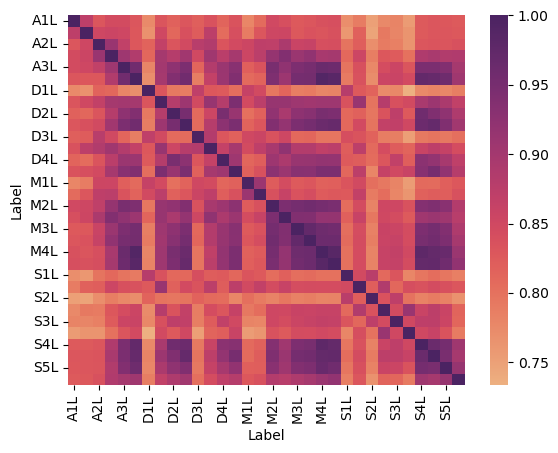

In [60]:
sns.heatmap(sig_roi_mtx.apply(pd.to_numeric), cmap='flare')

## Annotation Analysis

In [19]:
video_timing = pd.read_csv(proj_dir+'derivatives/task-naturalistic/stimuli/video_timing.csv')
video_timing.head()

,Run,Video,Onset
0,1,grapes_hd,13.750
1,1,wedding_hd,146.149
2,1,awkward_hd,367.617
3,2,ballet_hd,13.750
4,2,penguin_hd,211.556


In [20]:
run = 1

run_video_timing = video_timing[video_timing['Run'] == run]

In [22]:
run_annot_data = {}

for i_run in range(4):
    run_video_timing = video_timing[video_timing['Run'] == i_run]

    for i_vid in range(len(run_video_timing)):
        video_name = run_video_timing.iloc[i_vid]['Video']
        run_annot_data[video_name] = pd.read_csv(proj_dir+'derivatives/video_analysis/annotations/'+video_name+'_annotations.csv',
                                                index_col=0)



In [23]:
run_annot_data['grapes_hd'].head()

,Text,Start_time,End_time,Text_clean,neg,neu,pos
0,"I remember we were working when my father says,",0.74,4.70,"remember working father say ,",0.0,1.0,0.0
1,"come on, we're leaving.",4.92,6.16,"come , 're leaving .",0.0,1.0,0.0
2,"I says, we're leaving.",7.10,8.00,"say , 're leaving .",0.0,1.0,0.0
3,It's 10 o'clock in the morning.,8.26,9.14,'s 10 o'clock morning .,0.0,1.0,0.0
4,So we left.,9.98,10.86,left .,0.0,1.0,0.0


### Create Regressors

In [24]:
from nilearn.glm.first_level import compute_regressor

In [32]:
run_trs

{'1': 476, '2': 480, '3': 476, '4': 472, '5': 268, '6': 191, '7': 505}

In [339]:
run_pyfeat_data[temp_video]['Onset']

TR
0      408.261
1      409.261
2      410.261
3      411.261
4      412.261
        ...   
160    568.261
161    569.261
162    570.261
163    571.261
164    572.261
Name: Onset, Length: 165, dtype: float64

In [338]:
video_features = pd.DataFrame()

features = ['neg','neu','pos']
features_feat = ['anger', 'disgust', 'fear', 'happiness', 'sadness', 'surprise', 'neutral']
all_features = features + features_feat

for i_run in video_timing['Run'].unique()[:4]:
    tr = 1.25  # repetition time is 1 second
    n_scans = run_trs[str(i_run)]  # the acquisition comprises 128 scans
    frame_times = np.arange(n_scans) * tr 
    
    events = pd.DataFrame(columns=['trial_type', 'onset', 'duration'])
    events_feat = pd.DataFrame(columns=['trial_type', 'onset', 'duration'])
    
    run_video_timing = video_timing[video_timing['Run'] == i_run]

    run_annot_data = {}
    run_pyfeat_data = {}
    
    for i_vid in range(len(run_video_timing)):
        video_name = run_video_timing.iloc[i_vid]['Video']
        run_annot_data[video_name] = pd.read_csv(proj_dir+'derivatives/video_analysis/annotations/'+video_name+'_annotations.csv',
                                                    index_col=0)

        run_pyfeat_data[video_name] = pd.read_csv(proj_dir+'derivatives/video_analysis/annotations/'+video_name+'_annotations-feat.csv',
                                                    index_col=0)

        # Replace na with 0
        run_pyfeat_data[video_name] = run_pyfeat_data[video_name].fillna(0)
    
    for temp_video in run_annot_data.keys():
        temp_events = pd.DataFrame(columns=['trial_type', 'onset', 'duration'])
    
        video_onset = run_video_timing[run_video_timing['Video'] == temp_video]['Onset'].iloc[0]
        
        temp_events['trial_type'] = run_annot_data[temp_video]['Text']
        temp_events['onset'] = pd.to_numeric(run_annot_data[temp_video]['Start_time']) + video_onset
        temp_events['duration'] = pd.to_numeric(run_annot_data[temp_video]['End_time'] - run_annot_data[temp_video]['Start_time'])

        for feat in features:
            temp_events[feat] = pd.to_numeric(run_annot_data[temp_video][feat])
        
        events = pd.concat([events, temp_events], ignore_index=True)


        # Pyfeat
        temp_events_feat = pd.DataFrame(columns=['trial_type', 'onset', 'duration'])
    
        video_onset = run_video_timing[run_video_timing['Video'] == temp_video]['Onset'].iloc[0]
        
        temp_events_feat['onset'] = pd.to_numeric(run_pyfeat_data[temp_video]['Onset'])
        temp_events_feat['trial_type'] = temp_video
        temp_events_feat['duration'] = 1
        
        for pyfeat in features_feat:
            temp_events_feat[pyfeat] = pd.to_numeric(run_pyfeat_data[temp_video][pyfeat])
        
        events_feat = pd.concat([events_feat, temp_events_feat], ignore_index=True)

    events_feat.to_csv(proj_dir+'derivatives/video_analysis/annotations/'+'design_matrix_run-'+str(i_run)+'.csv')
    
    # Make empty dataframe for feature regressors
    features_df = pd.DataFrame(index = frame_times)
    
    
    
    for feat in features:
        #events[feat] = pd.to_numeric(events[feat])
    
        temp_dm = events[['onset','duration',feat]].to_numpy()
        signal, _labels = compute_regressor(temp_dm.T, 'spm', 
                                                frame_times, con_id=feat)
    
        features_df[feat] = signal

    for feat in features_feat:
        #events_feat[feat] = pd.to_numeric(events_feat[feat])
    
        temp_dm_feat = events_feat[['onset','duration',feat]].to_numpy()
        signal_feat, _labels = compute_regressor(temp_dm_feat.T, 'spm', 
                                                frame_times, con_id=feat)
    
        features_df[feat] = signal_feat

    # Reset index to be TRs rather than time in seconds
    features_df = features_df.reset_index(drop=True)
    features_df['Run'] = i_run

    video_features = pd.concat([video_features, features_df], ignore_index=True)
    
    #video_features = video_features.reset_index(drop=True)


/var/folders/85/t_6qbb0j2pvbbd0sq3zrwbc00000gq/T/ipykernel_29555/4059891393.py:43: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

/var/folders/85/t_6qbb0j2pvbbd0sq3zrwbc00000gq/T/ipykernel_29555/4059891393.py:58: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

/var/folders/85/t_6qbb0j2pvbbd0sq3zrwbc00000gq/T/ipykernel_29555/4059891393.py:43: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or a

<Axes: >

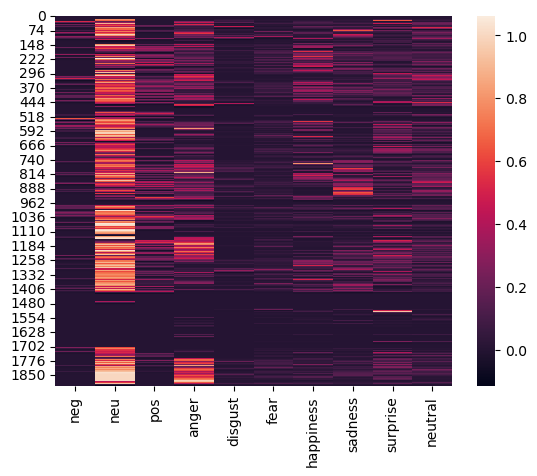

In [223]:
sns.heatmap(video_features[all_features])

In [225]:
roi_annot_summary = pd.DataFrame(columns=['ROI','Activation']+all_features)

i_row = 0

# Only include data for first four runs
group_roi_ts_stats_run = dict()

for temp_roi in cb_roi_names:
    group_roi_ts_stats_run[temp_roi] = group_roi_ts_stats[temp_roi][group_roi_ts_stats[temp_roi]['Run'].isin(['1','2','3','4'])]
    
    for temp_act in ['pos', 'neg']:
        for temp_feat in all_features:
            # Add feature data to time series MRI data
            group_roi_ts_stats_run[temp_roi].loc[:,temp_feat] = list(pd.to_numeric(video_features[temp_feat]))
            
            temp_roi_data = group_roi_ts_stats_run[temp_roi]

            if temp_act == 'pos':
                temp_roi_data_act = temp_roi_data[temp_roi_data['mean'] > 0]
            else:
                temp_roi_data_act = temp_roi_data[temp_roi_data['mean'] < 0]
            
            if sum(temp_roi_data_act['sig_tw'] == 1) == 0:
                temp_feat_score = 0
            else:
                temp_feat_sig = temp_roi_data_act[temp_roi_data_act['sig_tw'] == 1][temp_feat]
                temp_feat_score = sum(temp_feat_sig)/len(temp_feat_sig)
                
                
                #roi_annot_summary.loc[temp_roi, temp_feat] = sum(features_df.loc[temp_feat_sig,temp_feat])/len(temp_feat_sig)

            roi_annot_summary.loc[i_row, 'ROI'] = temp_roi
            roi_annot_summary.loc[i_row, 'Activation'] = temp_act
            roi_annot_summary.loc[i_row, temp_feat] = temp_feat_score

        i_row += 1

roi_annot_summary.head()

/var/folders/85/t_6qbb0j2pvbbd0sq3zrwbc00000gq/T/ipykernel_29555/3732785548.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/85/t_6qbb0j2pvbbd0sq3zrwbc00000gq/T/ipykernel_29555/3732785548.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/85/t_6qbb0j2pvbbd0sq3zrwbc00000gq/T/ipykernel_29555/3732785548.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

,ROI,Activation,neg,neu,pos,anger,disgust,fear,happiness,sadness,surprise,neutral
0,M1L,pos,0.012636,0.481837,0.080834,0.172041,0.015519,0.031777,0.068289,0.071834,0.11408,0.077016
1,M1L,neg,0.026479,0.339219,0.046014,0.208501,0.009214,0.032006,0.081259,0.038358,0.085691,0.061497
2,M2L,pos,0.017624,0.520648,0.082629,0.231956,0.011772,0.033797,0.11365,0.057455,0.112981,0.054649
3,M2L,neg,0.004119,0.514213,0.049152,0.38338,0.011602,0.053079,0.088982,0.053113,0.152139,0.098476
4,M3L,pos,0.005347,0.434064,0.160971,0.32254,0.015909,0.040708,0.070605,0.038769,0.056088,0.048692


[Text(0, 0.5, ''),
 Text(0, 2.5, ''),
 Text(0, 4.5, ''),
 Text(0, 6.5, ''),
 Text(0, 8.5, ''),
 Text(0, 10.5, ''),
 Text(0, 12.5, ''),
 Text(0, 14.5, ''),
 Text(0, 16.5, ''),
 Text(0, 18.5, ''),
 Text(0, 20.5, ''),
 Text(0, 22.5, ''),
 Text(0, 24.5, ''),
 Text(0, 26.5, ''),
 Text(0, 28.5, ''),
 Text(0, 30.5, '')]

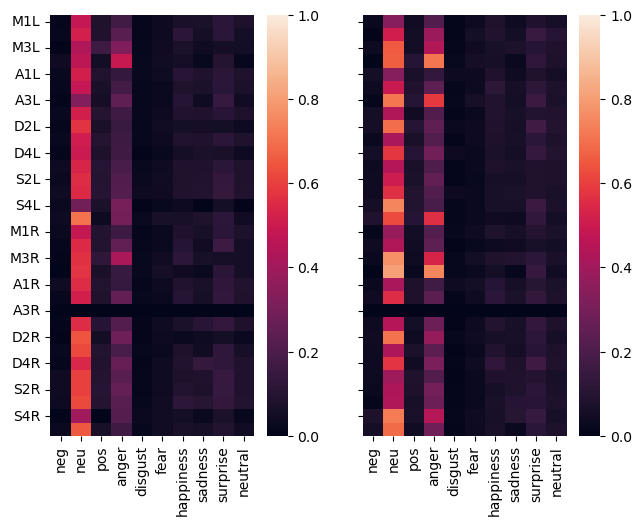

In [226]:
fig, (ax1, ax2) = plt.subplots(1,2)
fig.tight_layout()

roi_annot_summary_pos = roi_annot_summary[roi_annot_summary['Activation'] == 'pos'][all_features]
roi_annot_summary_neg = roi_annot_summary[roi_annot_summary['Activation'] == 'neg'][all_features]
roi_annot_summary_pos.index = roi_annot_summary['ROI'].unique()
roi_annot_summary_neg.index = roi_annot_summary['ROI'].unique()

plot1 = sns.heatmap(roi_annot_summary_pos.apply(pd.to_numeric), ax=ax1, vmax=1)
plot2 = sns.heatmap(roi_annot_summary_neg.apply(pd.to_numeric), ax=ax2, vmax=1)
plot2.set_yticklabels('')

In [230]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

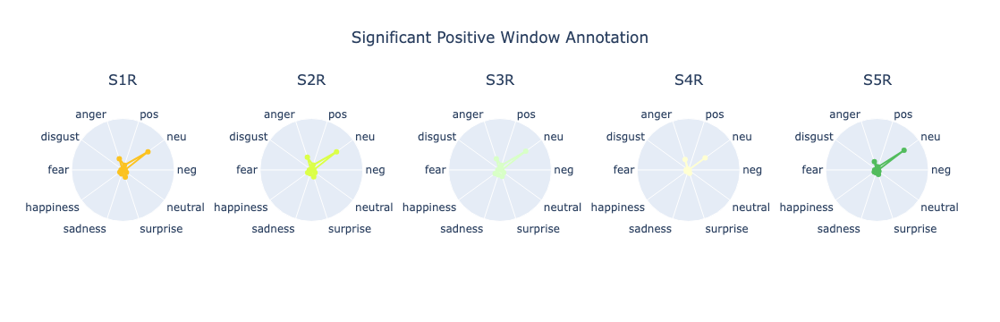

In [332]:
fig = go.Figure()

plot_roi_list = ['S1R','S2R','S3R','S4R','S5R']

fig = make_subplots(rows=1, cols=len(plot_roi_list),
                   specs=[[{"type": "polar"} for _ in range(len(plot_roi_list))]],
                   horizontal_spacing=0.1, vertical_spacing=0.25,
                   subplot_titles=plot_roi_list)

for i in range(len(plot_roi_list)):
    

    roi_hex = to_hex(list(cb_atlas_labels.loc[cb_atlas_labels['Label'] == plot_roi_list[i], ['R','G','B']].iloc[0]))
    #roi_palette = sns.color_palette('light:'+roi_hex, 5)
    
    temp_roi_data = roi_annot_summary_pos[roi_annot_summary_pos.index == plot_roi_list[i]]
    fig.add_trace(
                go.Scatterpolar(r=temp_roi_data.values.tolist()[0] + temp_roi_data.values.tolist()[0][:1],
                                theta=temp_roi_data.columns.tolist() + temp_roi_data.columns.tolist()[:1],
                                name=temp_roi_data.index[0],
                                showlegend=False,
                                line_color=roi_hex), 
        row=1, col=i+1)

    layout_options = dict(radialaxis=dict(visible=False, range=[0, 1]))
    
    fig.update_layout(
        polar=layout_options,
        polar2=layout_options,
        polar3=layout_options,
        polar4=layout_options,
        polar5=layout_options,
        title={
        'text': "Significant Positive Window Annotation",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

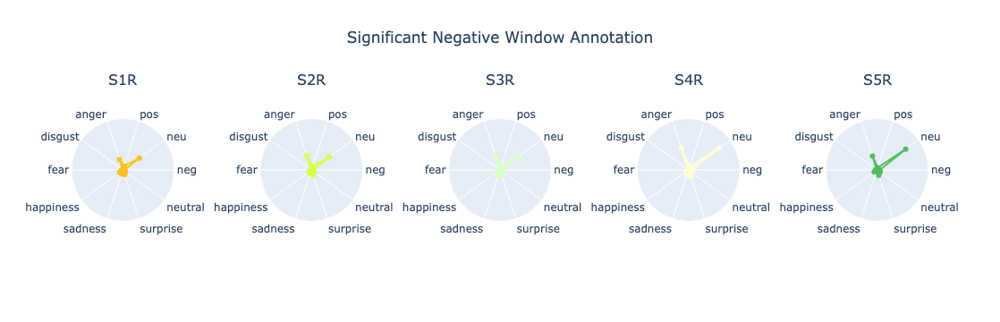

In [330]:
fig = go.Figure()

plot_roi_list = ['S1R','S2R','S3R','S4R','S5R']

fig = make_subplots(rows=1, cols=len(plot_roi_list),
                   specs=[[{"type": "polar"} for _ in range(len(plot_roi_list))]],
                   horizontal_spacing=0.1, vertical_spacing=0.25,
                   subplot_titles=plot_roi_list)

for i in range(len(plot_roi_list)):
    

    roi_hex = to_hex(list(cb_atlas_labels.loc[cb_atlas_labels['Label'] == plot_roi_list[i], ['R','G','B']].iloc[0]))
    #roi_palette = sns.color_palette('light:'+roi_hex, 5)
    
    temp_roi_data = roi_annot_summary_neg[roi_annot_summary_neg.index == plot_roi_list[i]]
    fig.add_trace(
                go.Scatterpolar(r=temp_roi_data.values.tolist()[0] + temp_roi_data.values.tolist()[0][:1],
                                theta=temp_roi_data.columns.tolist() + temp_roi_data.columns.tolist()[:1],
                                name=temp_roi_data.index[0],
                                showlegend=False,
                                line_color=roi_hex), 
        row=1, col=i+1)

    layout_options = dict(radialaxis=dict(visible=False, range=[0, 1]))
    
    fig.update_layout(
        polar=layout_options,
        polar2=layout_options,
        polar3=layout_options,
        polar4=layout_options,
        polar5=layout_options,
        title={
        'text': "Significant Negative Window Annotation",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()